In [1]:
# ═══════════════════════════════════════════════════════════════════════════════
# MVP — SÍNTESIS FÍSICAMENTE IMPLEMENTABLE DE MECANISMO 4-BARRAS
# -----------------------------------------------------------------------------
# OBJETIVO:
# Sintetizar un mecanismo 4 barras que:
#
#   ✓ siga las características principales de trayectoria_abeja.csv
#   ✓ sea Grashof
#   ✓ tenga rotación completa del crank
#   ✓ NO tenga branch switching
#   ✓ NO tenga discontinuidades
#   ✓ tenga transmisión razonable
#   ✓ sea manufacturable para un autómata real
#
# FILOSOFÍA:
# Este notebook NO busca el mejor curve fitting matemático.
# Busca el mejor mecanismo FÍSICAMENTE IMPLEMENTABLE.
#
# REFERENCIAS:
# - Norton, Design of Machinery
# - Kota, Coupler Curve Design Space
# - Síntesis de trayectoria con restricciones físicas
# ═══════════════════════════════════════════════════════════════════════════════

In [2]:
# ═══════════════════════════════════════════════════════════════════════════════
# IMPORTS
# ═══════════════════════════════════════════════════════════════════════════════

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

from numpy import pi, deg2rad, rad2deg

from scipy.optimize import (
    fsolve,
    differential_evolution,
    minimize
)

from scipy.spatial.distance import directed_hausdorff

import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation

from IPython.display import HTML

plt.rcParams['figure.dpi'] = 120

np.set_printoptions(
    precision=5,
    suppress=True
)

print("Dependencias cargadas.")

Dependencias cargadas.


Puntos: 500


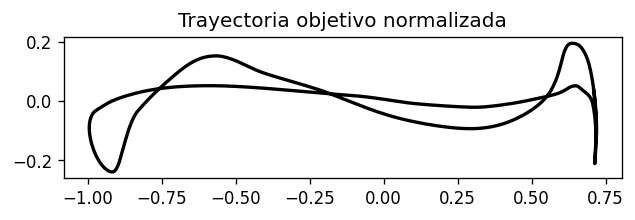

In [3]:
# ═══════════════════════════════════════════════════════════════════════════════
# CARGA DE TRAYECTORIA OBJETIVO
# ═══════════════════════════════════════════════════════════════════════════════

df = pd.read_csv("trayectoria_abeja.csv")

TRAYECTORIA_OBJETIVO = df[['x', 'y']].values

# centrar
centroide = TRAYECTORIA_OBJETIVO.mean(axis=0)

TRAYECTORIA_OBJETIVO = (
    TRAYECTORIA_OBJETIVO
    - centroide
)

# normalizar
escala = np.max(
    np.linalg.norm(
        TRAYECTORIA_OBJETIVO,
        axis=1
    )
)

TRAYECTORIA_OBJETIVO /= escala

print(f"Puntos: {len(TRAYECTORIA_OBJETIVO)}")

fig, ax = plt.subplots(figsize=(6,6))

ax.plot(
    TRAYECTORIA_OBJETIVO[:,0],
    TRAYECTORIA_OBJETIVO[:,1],
    'k-',
    lw=2
)

ax.set_aspect('equal')

ax.set_title(
    'Trayectoria objetivo normalizada'
)

plt.show()

In [4]:
# ═══════════════════════════════════════════════════════════════════════════════
# MODELO DE MECANISMO 4-BARRAS
# ═══════════════════════════════════════════════════════════════════════════════

class FourBar:

    def __init__(
        self,
        L1,
        L2,
        L3,
        L4,
        d,
        gamma
    ):

        self.L1 = float(L1)
        self.L2 = float(L2)
        self.L3 = float(L3)
        self.L4 = float(L4)

        self.d = float(d)

        self.gamma = float(gamma)

        self._z0 = np.array([0.3, 2.5])

    # ──────────────────────────────────────────────────────────────────────
    # GRASHOF
    # ──────────────────────────────────────────────────────────────────────

    def grashof(self):

        links = np.array([
            self.L1,
            self.L2,
            self.L3,
            self.L4
        ])

        s = np.min(links)
        l = np.max(links)

        others = np.sort(links)[1:3]

        cond = (s + l) <= np.sum(others)

        shortest = np.argmin(links)

        if cond:

            tipos = {
                0: 'double-crank',
                1: 'crank-rocker',
                2: 'double-rocker',
                3: 'rocker-crank'
            }

            tipo = tipos[shortest]

        else:

            tipo = 'triple-rocker'

        return {
            'grashof': cond,
            'type': tipo
        }

    # ──────────────────────────────────────────────────────────────────────
    # ECUACIONES DE CIERRE
    # ──────────────────────────────────────────────────────────────────────

    def residuals(self, x, theta2):

        theta3, theta4 = x

        f1 = (
            self.L2*np.cos(theta2)
            + self.L3*np.cos(theta3)
            - self.L1
            - self.L4*np.cos(theta4)
        )

        f2 = (
            self.L2*np.sin(theta2)
            + self.L3*np.sin(theta3)
            - self.L4*np.sin(theta4)
        )

        return [f1, f2]

    # ──────────────────────────────────────────────────────────────────────
    # FORWARD KINEMATICS
    # ──────────────────────────────────────────────────────────────────────

    def FK(self, theta2):

        sol, info, ier, _ = fsolve(
            self.residuals,
            self._z0,
            args=(theta2,),
            xtol=1e-10,
            full_output=True
        )

        success = (
            ier == 1
            and np.max(np.abs(info['fvec'])) < 1e-8
        )

        if success:

            # continuidad angular
            d3 = np.abs(sol[0] - self._z0[0])

            d4 = np.abs(sol[1] - self._z0[1])

            if d3 > np.pi/2 or d4 > np.pi/2:
                return sol, False

            self._z0 = sol.copy()

        return sol, success

    # ──────────────────────────────────────────────────────────────────────
    # POSICIONES
    # ──────────────────────────────────────────────────────────────────────

    def joint_positions(self, theta2):

        (theta3, theta4), ok = self.FK(theta2)

        if not ok:
            return {'ok': False}

        O2 = np.array([0,0])

        O4 = np.array([self.L1, 0])

        A = O2 + self.L2*np.array([
            np.cos(theta2),
            np.sin(theta2)
        ])

        B = O4 + self.L4*np.array([
            np.cos(theta4),
            np.sin(theta4)
        ])

        P = A + self.d*np.array([
            np.cos(theta3 + self.gamma),
            np.sin(theta3 + self.gamma)
        ])

        return {
            'ok': True,
            'O2': O2,
            'A': A,
            'B': B,
            'O4': O4,
            'P': P
        }

    # ──────────────────────────────────────────────────────────────────────
    # CURVA ACOPLADOR
    # ──────────────────────────────────────────────────────────────────────

    def coupler_curve(self, n=240):

        self._z0 = np.array([0.3, 2.5])

        curve = []

        theta_vals = np.linspace(
            0,
            2*np.pi,
            n
        )

        for theta2 in theta_vals:

            pts = self.joint_positions(theta2)

            if not pts['ok']:
                return np.empty((0,2))

            curve.append(pts['P'])

        return np.array(curve)

In [5]:
# ═══════════════════════════════════════════════════════════════════════════════
# MÉTRICAS FÍSICAS
# ═══════════════════════════════════════════════════════════════════════════════

def transmission_angle_penalty(mech):

    mus = []

    for th2 in np.linspace(0, 2*np.pi, 120):

        pts = mech.joint_positions(th2)

        if not pts['ok']:
            return 1e6

        A = pts['A']
        B = pts['B']
        O4 = pts['O4']

        v1 = A - B
        v2 = O4 - B

        n1 = np.linalg.norm(v1)
        n2 = np.linalg.norm(v2)

        if n1 < 1e-8 or n2 < 1e-8:
            return 1e6

        mu = np.arccos(
            np.clip(
                np.dot(v1,v2)/(n1*n2),
                -1,
                1
            )
        )

        mus.append(
            np.rad2deg(mu)
        )

    mu_min = np.min(mus)

    if mu_min < 35:
        return (35 - mu_min)**2

    return 0.0

In [6]:
# ═══════════════════════════════════════════════════════════════════════════════
# RESAMPLING
# ═══════════════════════════════════════════════════════════════════════════════

def resample_curve(curve, n=200):

    diffs = np.diff(curve, axis=0)

    segs = np.linalg.norm(diffs, axis=1)

    s = np.concatenate([[0], np.cumsum(segs)])

    s_new = np.linspace(0, s[-1], n)

    x = np.interp(s_new, s, curve[:,0])

    y = np.interp(s_new, s, curve[:,1])

    return np.column_stack([x,y])

In [7]:
# ═══════════════════════════════════════════════════════════════════════════════
# FUNCIÓN OBJETIVO FÍSICAMENTE IMPLEMENTABLE
# ═══════════════════════════════════════════════════════════════════════════════

def synthesis_cost(params):

    L1, L3, L4, d, gamma = params

    # longitudes válidas
    if min([L1,L3,L4,d]) <= 0:
        return 1e6

    mech = FourBar(
        L1=L1,
        L2=1.0,
        L3=L3,
        L4=L4,
        d=d,
        gamma=gamma
    )

    # ──────────────────────────────────────────────────────────────────
    # GRASHOF OBLIGATORIO
    # ──────────────────────────────────────────────────────────────────

    g = mech.grashof()

    if not g['grashof']:
        return 1e6

    if g['type'] not in [
        'crank-rocker',
        'rocker-crank'
    ]:
        return 1e6

    # ──────────────────────────────────────────────────────────────────
    # CURVA COMPLETA
    # ──────────────────────────────────────────────────────────────────

    curve = mech.coupler_curve(240)

    if len(curve) < 200:
        return 1e6

    # ──────────────────────────────────────────────────────────────────
    # DISCONTINUIDADES
    # ──────────────────────────────────────────────────────────────────

    diffs = np.linalg.norm(
        np.diff(curve, axis=0),
        axis=1
    )

    if np.max(diffs) > 0.5:
        return 1e6

    # ──────────────────────────────────────────────────────────────────
    # RESAMPLING
    # ──────────────────────────────────────────────────────────────────

    curve = resample_curve(curve, 200)

    target = resample_curve(
        TRAYECTORIA_OBJETIVO,
        200
    )

    # ──────────────────────────────────────────────────────────────────
    # NORMALIZACIÓN
    # ──────────────────────────────────────────────────────────────────

    curve -= curve.mean(axis=0)

    target -= target.mean(axis=0)

    curve /= np.max(np.linalg.norm(curve, axis=1))

    target /= np.max(np.linalg.norm(target, axis=1))

    # ──────────────────────────────────────────────────────────────────
    # ERROR GEOMÉTRICO
    # ──────────────────────────────────────────────────────────────────

    rms = np.sqrt(
        np.mean(
            np.sum(
                (curve-target)**2,
                axis=1
            )
        )
    )

    h1 = directed_hausdorff(
        curve,
        target
    )[0]

    h2 = directed_hausdorff(
        target,
        curve
    )[0]

    haus = max(h1,h2)

    # ──────────────────────────────────────────────────────────────────
    # TRANSMISSION ANGLE
    # ──────────────────────────────────────────────────────────────────

    mu_penalty = transmission_angle_penalty(mech)

    # ──────────────────────────────────────────────────────────────────
    # COSTO FINAL
    # ──────────────────────────────────────────────────────────────────

    cost = (
        0.5*rms
        + 0.5*haus
        + 0.2*mu_penalty
    )

    return cost

In [8]:
# ═══════════════════════════════════════════════════════════════════════════════
# OPTIMIZACIÓN
# ═══════════════════════════════════════════════════════════════════════════════

BOUNDS = [

    (0.5, 4.0),   # L1
    (0.5, 4.0),   # L3
    (0.5, 3.0),   # L4
    (0.2, 3.0),   # d
    (-np.pi, np.pi)

]

print("Iniciando síntesis física...")

resultado = differential_evolution(

    synthesis_cost,

    bounds=BOUNDS,

    maxiter=250,

    popsize=20,

    mutation=(0.5, 1.0),

    recombination=0.8,

    polish=True,

    disp=True,

    workers=1,

    seed=1

)

print("\nOptimización finalizada.")

Iniciando síntesis física...
differential_evolution step 1: f(x)= 0.36130649374931173
differential_evolution step 2: f(x)= 0.3383850384261532
differential_evolution step 3: f(x)= 0.3383850384261532
differential_evolution step 4: f(x)= 0.3383850384261532
differential_evolution step 5: f(x)= 0.31189970200302786
differential_evolution step 6: f(x)= 0.31189970200302786
differential_evolution step 7: f(x)= 0.2918531895646335
differential_evolution step 8: f(x)= 0.29064285342011886
differential_evolution step 9: f(x)= 0.28734848193577955
differential_evolution step 10: f(x)= 0.2547128397148116
differential_evolution step 11: f(x)= 0.2547128397148116
differential_evolution step 12: f(x)= 0.24891247388625937
differential_evolution step 13: f(x)= 0.24891247388625937
differential_evolution step 14: f(x)= 0.24891247388625937
differential_evolution step 15: f(x)= 0.24693867544350853
differential_evolution step 16: f(x)= 0.24539271715218358
differential_evolution step 17: f(x)= 0.24539271715218358


In [9]:
# ═══════════════════════════════════════════════════════════════════════════════
# RESULTADOS
# ═══════════════════════════════════════════════════════════════════════════════

L1_opt, L3_opt, L4_opt, d_opt, gamma_opt = resultado.x

mec_opt = FourBar(
    L1_opt,
    1.0,
    L3_opt,
    L4_opt,
    d_opt,
    gamma_opt
)

curve_opt = mec_opt.coupler_curve(360)

print("\n═══ MECANISMO FINAL ═══")

print(f"L1 = {L1_opt:.4f}")
print(f"L2 = 1.0000")
print(f"L3 = {L3_opt:.4f}")
print(f"L4 = {L4_opt:.4f}")

print(f"d  = {d_opt:.4f}")

print(f"γ  = {rad2deg(gamma_opt):.2f}°")

g = mec_opt.grashof()

print(f"\nGrashof: {g['grashof']}")
print(f"Tipo   : {g['type']}")

print(f"\nCosto final: {resultado.fun:.5f}")


═══ MECANISMO FINAL ═══
L1 = 2.9966
L2 = 1.0000
L3 = 3.1362
L4 = 1.7022
d  = 2.9932
γ  = -9.07°

Grashof: True
Tipo   : crank-rocker

Costo final: 0.21157


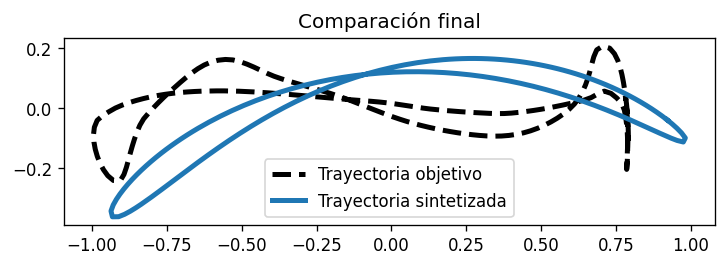

In [10]:
# ═══════════════════════════════════════════════════════════════════════════════
# COMPARACIÓN DE CURVAS
# ═══════════════════════════════════════════════════════════════════════════════

curve_plot = resample_curve(curve_opt, 200)

curve_plot -= curve_plot.mean(axis=0)

curve_plot /= np.max(
    np.linalg.norm(
        curve_plot,
        axis=1
    )
)

target_plot = resample_curve(
    TRAYECTORIA_OBJETIVO,
    200
)

target_plot -= target_plot.mean(axis=0)

target_plot /= np.max(
    np.linalg.norm(
        target_plot,
        axis=1
    )
)

fig, ax = plt.subplots(figsize=(7,7))

ax.plot(
    target_plot[:,0],
    target_plot[:,1],
    'k--',
    lw=3,
    label='Trayectoria objetivo'
)

ax.plot(
    curve_plot[:,0],
    curve_plot[:,1],
    lw=3,
    label='Trayectoria sintetizada'
)

ax.set_aspect('equal')

ax.legend()

ax.set_title(
    'Comparación final'
)

plt.show()

In [11]:
# ═══════════════════════════════════════════════════════════════════════════════
# ANIMACIÓN FINAL
# ═══════════════════════════════════════════════════════════════════════════════

fig, ax = plt.subplots(figsize=(8,8))

ax.set_aspect('equal')

ax.grid(True)

ax.plot(
    curve_opt[:,0],
    curve_opt[:,1],
    '--',
    color='lightgray'
)

xmin = curve_opt[:,0].min()
xmax = curve_opt[:,0].max()

ymin = curve_opt[:,1].min()
ymax = curve_opt[:,1].max()

pad = 1.0

ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)

link1, = ax.plot([], [], lw=5)
link2, = ax.plot([], [], lw=5)
link3, = ax.plot([], [], lw=5)
ground, = ax.plot([], [], 'k--', lw=3)

trail, = ax.plot([], [], 'r-', lw=2)

jointP, = ax.plot([], [], '*', ms=14)

hist_x = []
hist_y = []

theta_vals = np.linspace(
    0,
    2*np.pi,
    240
)

def update(i):

    theta2 = theta_vals[i]

    pts = mec_opt.joint_positions(theta2)

    if not pts['ok']:
        return ()

    O2 = pts['O2']
    A = pts['A']
    B = pts['B']
    O4 = pts['O4']
    P = pts['P']

    link1.set_data(
        [O2[0], A[0]],
        [O2[1], A[1]]
    )

    link2.set_data(
        [A[0], B[0]],
        [A[1], B[1]]
    )

    link3.set_data(
        [O4[0], B[0]],
        [O4[1], B[1]]
    )

    ground.set_data(
        [O2[0], O4[0]],
        [O2[1], O4[1]]
    )

    jointP.set_data(
        [P[0]],
        [P[1]]
    )

    hist_x.append(P[0])
    hist_y.append(P[1])

    trail.set_data(
        hist_x,
        hist_y
    )

    return (
        link1,
        link2,
        link3,
        ground,
        trail,
        jointP
    )

anim = FuncAnimation(
    fig,
    update,
    frames=len(theta_vals),
    interval=25,
    blit=True
)

plt.close()

HTML(anim.to_jshtml())